<a href="https://colab.research.google.com/github/gabrielfernandorey/IEBS/blob/main/Nuevo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IEBS
### Proyecto fin de Postgrado
--- 
- Preparacion de los datos y entrenamiento
- Alumno: Gabriel Rey

## Clonar repositorio

In [1]:
user='gabrielfernandorey'
git_repository = "https://github.com/"+user+"/IEBS.git"

!git clone {git_repository}

Cloning into 'IEBS'...
remote: Enumerating objects: 101, done.
remote: Counting objects: 100% (84/84), done.
remote: Compressing objects: 100% (68/68), done.
remote: Total 101 (delta 46), reused 43 (delta 11), pack-reused 17
Receiving objects: 100% (101/101), 85.80 MiB | 20.49 MiB/s, done.
Resolving deltas: 100% (46/46), done.
Updating files: 100% (22/22), done.


## Importamos librerias

In [2]:
import os
import struct

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import pandas as pd

import librosa
import librosa.display
from IPython import display as ipd
from PIL import Image

In [3]:
# Setear semilla para reproduccion
seed = 42
np.random.seed(seed)

## Importar archivos WAV

In [4]:
filenames = !ls -1 '/content/IEBS/Data'
filenames

['BENTEVEO_COMÚN.wav',
 'CABECITANEGRA_COMÚN.wav',
 'CALANDRIA_GRANDE.wav',
 'CARDENAL_AMARILLO.wav',
 'CARDENAL_COMUN.wav',
 'COTORRA.wav',
 'GOLONDRINA_DOMÉSTICA.wav',
 'GORRIÓN.wav',
 'HORNERO.wav',
 'JILGUERO_DORADO.wav',
 'RUIDO.wav',
 'ZORZAL_COLORADO.wav']

In [5]:
num_samples = len(filenames)
print('Numero total de clases:', num_samples)

Numero total de clases: 12


### Atributos de los archivos de audio

In [6]:
class WavFileHelper():
    
    def read_file_properties(self, filename):
        wave_file = open(filename, "rb")

        riff = wave_file.read(12)
        fmt = wave_file.read(36)

        ChunkSizeString = riff[4:8]
        ChunkSize = struct.unpack('I', ChunkSizeString) 
        size = round(ChunkSize[0]/1024)
        
        num_channels_string = fmt[10:12]
        num_channels = struct.unpack('<H', num_channels_string)[0]

        sample_rate_string = fmt[12:16]
        sample_rate = struct.unpack("<I", sample_rate_string)[0]
        
        byte_rate_string = fmt[16:20]
        byte_rate = struct.unpack("<I", byte_rate_string)[0] 

        bit_depth_string = fmt[22:24]
        bit_depth = struct.unpack("<H", bit_depth_string)[0]
        
        timeInSec = size*1024/byte_rate
        
        return (filename, size, num_channels, sample_rate, round(timeInSec,2), bit_depth)

In [7]:
wavfilehelper = WavFileHelper()

In [8]:
audiodata = []
for file in filenames:
    data = wavfilehelper.read_file_properties('/content/IEBS/Data/'+file)
    audiodata.append(data)

In [9]:
# Visualizamos en un Pandas dataframe los atributos de los archivos de audio
audiodf = pd.DataFrame(audiodata, columns=['filename','KB','num_channels','sample_rate','timeInSec','bit_depth'])
audiodf

,filename,KB,num_channels,sample_rate,timeInSec,bit_depth
0,/content/IEBS/Data/BENTEVEO_COMÚN.wav,7299,1,44100,84.74,16
1,/content/IEBS/Data/CABECITANEGRA_COMÚN.wav,8764,1,44100,101.75,16
2,/content/IEBS/Data/CALANDRIA_GRANDE.wav,10634,1,44100,123.46,16
3,/content/IEBS/Data/CARDENAL_AMARILLO.wav,5432,1,44100,63.07,16
4,/content/IEBS/Data/CARDENAL_COMUN.wav,5451,1,44100,63.29,16
5,/content/IEBS/Data/COTORRA.wav,9900,1,44100,114.94,16
6,/content/IEBS/Data/GOLONDRINA_DOMÉSTICA.wav,2151,1,44100,24.97,16
7,/content/IEBS/Data/GORRIÓN.wav,3710,1,44100,43.07,16
8,/content/IEBS/Data/HORNERO.wav,2846,1,44100,33.04,16
9,/content/IEBS/Data/JILGUERO_DORADO.wav,3605,1,44100,41.85,16


### Cargar un audio de ejemplo

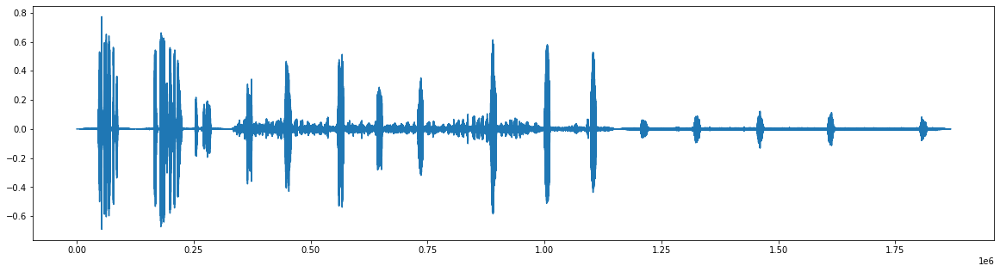

In [10]:
# Cargamos el primer audio de la lista
audio, sr = librosa.load('/content/IEBS/Data/'+filenames[0])
plt.figure(figsize=(20,5))
plt.plot(audio)
ipd.Audio(audio, rate=sr)

### Preprocesamiento


Se define una función para la extracción de N muestras de 5 segundos de duración para cada archivo de audio convertida cada una en espectrograma

In [11]:
class coefs:
       
    # Global vars
    sr = 44100               # librosa sample rate input
    sec = 5                  # seconds   
    sshape = (128, 128)      # height x width
    fmin = 500               # spectrum min frequency
    fmax = 12500             # spectrum max frequency

In [12]:
def extraer_muestras(filename, n_muestras):
    """
    ARGS
      filename: archivo de audio a procesar
      n_muestras: cantidad de muestras a obtener
    """
    carpeta = filename[:-4]
    path_save = '/content/IEBS/Audioimagen/' + carpeta
    os.makedirs(path_save, exist_ok=True)
        
    audio, _ = librosa.load('/content/IEBS/Data/'+filename)
    

    for n in range(n_muestras):
        start = np.random.randint(1, len(audio)-(coefs.sec * coefs.sr))
        chunk = audio[start:start + coefs.sec * coefs.sr]

        # Espectrograma para cada segmento de audio -------------------------
        hop_length = int(coefs.sec * coefs.sr / (coefs.sshape[1] - 1))
        mel_spec = librosa.feature.melspectrogram(y = chunk, 
                                                  sr = coefs.sr, 
                                                  n_fft = 1024, 
                                                  hop_length = hop_length, 
                                                  n_mels = coefs.sshape[0], 
                                                  fmin = coefs.fmin, 
                                                  fmax = coefs.fmax)
        
        mel_spec = librosa.power_to_db(mel_spec**2, ref=np.max) 

        # Normalize
        mel_spec -= mel_spec.min()
        mel_spec /= mel_spec.max()
        
        # Grabar imagen ------------------------------------------------------
        im = Image.fromarray(mel_spec * 255.0).convert("L")
        im.save(path_save+'/'+f'{carpeta}_{n}.png')

    print(f" {carpeta} - {n_muestras} Imágenes generadas")
    
    return 

In [13]:
for i in range(len(filenames)):
  extraer_muestras(filenames[i], 1000)

 BENTEVEO_COMÚN - 1000 Imágenes generadas
 CABECITANEGRA_COMÚN - 1000 Imágenes generadas
 CALANDRIA_GRANDE - 1000 Imágenes generadas
 CARDENAL_AMARILLO - 1000 Imágenes generadas
 CARDENAL_COMUN - 1000 Imágenes generadas
 COTORRA - 1000 Imágenes generadas
 GOLONDRINA_DOMÉSTICA - 1000 Imágenes generadas
 GORRIÓN - 1000 Imágenes generadas
 HORNERO - 1000 Imágenes generadas
 JILGUERO_DORADO - 1000 Imágenes generadas
 RUIDO - 1000 Imágenes generadas
 ZORZAL_COLORADO - 1000 Imágenes generadas


## Modelo Convolucional

In [14]:
import wave
import pylab
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from keras.models import Model
from keras.layers import Input, Dropout
from keras import layers
from keras.models import Sequential
from keras.layers.core import Dense, Flatten, Activation
from keras.callbacks import ModelCheckpoint, EarlyStopping

### Preparar datos de entrenamiento

In [15]:
batch_size = 16
img_height = 128
img_width = 128

DATASET_PATH='/content/IEBS/Audioimagen/'

In [16]:
train_ds = keras.utils.image_dataset_from_directory(
                directory=DATASET_PATH,
                label_mode='categorical',
                validation_split=0.2,
                subset="training",
                seed=123,
                image_size=(img_height, img_width),
                batch_size=batch_size)

Found 12000 files belonging to 12 classes.
Using 9600 files for training.


In [17]:
val_ds = keras.utils.image_dataset_from_directory(
                directory=DATASET_PATH,
                label_mode='categorical',
                validation_split=0.2,
                subset="validation",
                seed=123,
                image_size=(img_height, img_width),
                batch_size=batch_size)

Found 12000 files belonging to 12 classes.
Using 2400 files for validation.


### Obtener nombre de las clases

In [18]:
class_names = train_ds.class_names
print(class_names)

['BENTEVEO_COMÚN', 'CABECITANEGRA_COMÚN', 'CALANDRIA_GRANDE', 'CARDENAL_AMARILLO', 'CARDENAL_COMUN', 'COTORRA', 'GOLONDRINA_DOMÉSTICA', 'GORRIÓN', 'HORNERO', 'JILGUERO_DORADO', 'RUIDO', 'ZORZAL_COLORADO']


### Visualizar un ejemplo

tf.Tensor([0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], shape=(12,), dtype=float32)


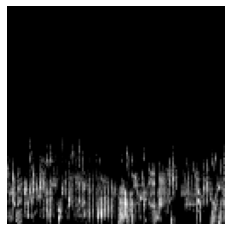

In [19]:
for images, labels in train_ds.take(1):    # cada take contiene la cantidad de imagenes definida en el batch_size
  plt.axis('off')
  plt.imshow(images[0].numpy().astype("uint8")) # visualizamos la primer imagen del batch_size
  print(labels[0])

### Modelo CNN + FC
Se modela la red con 4 capas convolucionales y 2 capas densas

In [ ]:
num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),

  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),

  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),

  layers.Conv2D(128, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),

  layers.Flatten(),
  layers.Dense(256, activation='relu'),
  layers.Dropout(0.5), 

  layers.Dense(256, activation='relu'),
  layers.Dropout(0.5), 

  layers.Dense(num_classes, activation='softmax')
])

In [ ]:
model.compile(loss = keras.losses.CategoricalCrossentropy(from_logits=False, label_smoothing=0.01),
              optimizer = tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics = ['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 16)      448       
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 32)       0

### Entrenamiento

In [ ]:
# Definimos una callback para aplicar early stop
callback = [ keras.callbacks.EarlyStopping(patience=2) ]

In [ ]:
epochs=10
history = model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=callback)

Epoch 1/10
600/600 [==============================] - 249s 412ms/step - loss: 0.6018 - accuracy: 0.8265 - val_loss: 0.1063 - val_accuracy: 0.9992
Epoch 2/10
600/600 [==============================] - 246s 410ms/step - loss: 0.1397 - accuracy: 0.9954 - val_loss: 0.0986 - val_accuracy: 1.0000
Epoch 3/10
600/600 [==============================] - 245s 408ms/step - loss: 0.1196 - accuracy: 0.9993 - val_loss: 0.0888 - val_accuracy: 1.0000
Epoch 4/10
600/600 [==============================] - 250s 417ms/step - loss: 0.1105 - accuracy: 0.9993 - val_loss: 0.0888 - val_accuracy: 1.0000
Epoch 5/10
600/600 [==============================] - 243s 404ms/step - loss: 0.1088 - accuracy: 0.9994 - val_loss: 0.0832 - val_accuracy: 1.0000
Epoch 6/10
600/600 [==============================] - 247s 412ms/step - loss: 0.1026 - accuracy: 0.9998 - val_loss: 0.0789 - val_accuracy: 1.0000
Epoch 7/10
600/600 [==============================] - 250s 417ms/step - loss: 0.0991 - accuracy: 0.9999 - val_loss: 0.0808 -

In [ ]:
model.save('/content/IEBS/Modelos/modelo.h5')

### Visualización de rendimiento

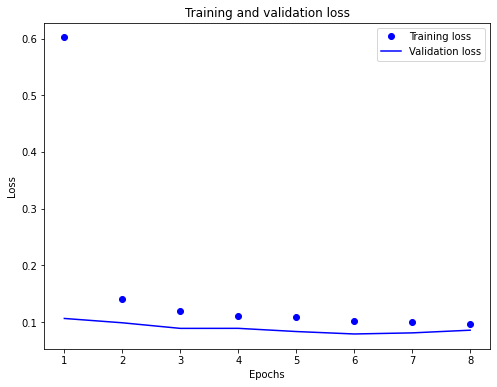

In [ ]:
history_dict = history.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values)+1)

plt.figure(figsize=(8,6))
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

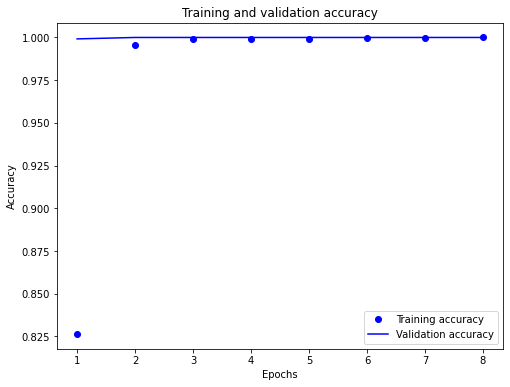

In [ ]:
acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values)+1)

plt.figure(figsize=(8,6))
plt.plot(epochs, acc_values, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc_values, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
# Resumen de los valores de loss y accuracy
final_loss, final_acc = model.evaluate(val_ds, verbose=0)
print("Final loss: {0:.6f}, final accuracy: {1:.6f}".format(final_loss, final_acc))

Final loss: 0.085569, final accuracy: 1.000000


### Probamos con una imagen aleatoria

In [20]:
from keras.models import load_model

In [21]:
model = load_model('/content/IEBS/Modelos/modelo.h5')

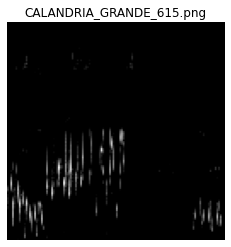

In [22]:
# Ruta del directorio padre
directorio_padre = '/content/IEBS/Audioimagen/'

# Lista de los subdirectorios
subdirectorios = os.listdir(directorio_padre)

# Elige un subdirectorio al azar
subdirectorio_aleatorio = np.random.choice(subdirectorios)

nro = np.random.randint(0, 1000)
imagen = '/content/IEBS/Audioimagen/' + subdirectorio_aleatorio + '/' + subdirectorio_aleatorio + '_' + str(nro) + '.png'
imagen_rgb = mpimg.imread(imagen) # para visualizar la imagen
plt.axis('off')
plt.title(subdirectorio_aleatorio + '_' + str(nro) + '.png')
plt.imshow(imagen_rgb, cmap='gray');

In [23]:
# Clasificacion
imagenMod = tf.keras.preprocessing.image.load_img(imagen, target_size=(128,128))
imagenMod = tf.keras.preprocessing.image.img_to_array(imagenMod)
imagenMod = np.expand_dims(imagenMod, axis=0) #(alto, ancho, 3) -> (1, alto, ancho, 3) 

np.set_printoptions(precision=4, suppress=True)
pred = model.predict(imagenMod).astype("float32")
print(pred)
print()
print(class_names[np.argmax(pred)])

1/1 [==============================] - 0s 284ms/step
[[0.     0.     0.9998 0.     0.     0.     0.     0.     0.     0.
  0.     0.    ]]

CALANDRIA_GRANDE


### Aplicacion

In [25]:
!apt-get install portaudio19-dev
!pip install pyaudio

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libportaudio2 libportaudiocpp0
Suggested packages:
  portaudio19-doc
The following NEW packages will be installed:
  libportaudio2 libportaudiocpp0 portaudio19-dev
0 upgraded, 3 newly installed, 0 to remove and 22 not upgraded.
Need to get 188 kB of archives.
After this operation, 926 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 libportaudio2 amd64 19.6.0-1build1 [65.4 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/universe amd64 libportaudiocpp0 amd64 19.6.0-1build1 [16.1 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/universe amd64 portaudio19-dev amd64 19.6.0-1build1 [106 kB]
Fetched 188 kB in 2s (104 kB/s)
Selecting previously unselected package libportaudio2:amd64.
(Reading database ... 128275 files and directories currently installed.)
Preparing to unpack .../libportaudio

In [30]:
import pyaudio
import time
from io import BytesIO
from base64 import b64decode
from google.colab import output
from IPython.display import Javascript

#### Obtener audio externo

In [31]:
RECORD = """
const sleep  = time => new Promise(resolve => setTimeout(resolve, time))
const b2text = blob => new Promise(resolve => {
  const reader = new FileReader()
  reader.onloadend = e => resolve(e.srcElement.result)
  reader.readAsDataURL(blob)
})
var record = time => new Promise(async resolve => {
  stream = await navigator.mediaDevices.getUserMedia({ audio: true })
  recorder = new MediaRecorder(stream)
  chunks = []
  recorder.ondataavailable = e => chunks.push(e.data)
  recorder.start()
  await sleep(time)
  recorder.onstop = async ()=>{
    blob = new Blob(chunks)
    text = await b2text(blob)
    resolve(text)
  }
  recorder.stop()
})
"""

In [32]:
def record(sec=3):
  print("Speak Now...")
  display(Javascript(RECORD))
  sec += 1
  s = output.eval_js('record(%d)' % (sec*1000))
  print("Done Recording !")
  b = b64decode(s.split(',')[1])
  return b #byte stream

In [55]:
audio_bytes = record(30)   #will record for 5 seconds

Speak Now...


<IPython.core.display.Javascript object>

Done Recording !


In [56]:
ipd.display(ipd.Audio(audio_bytes))

In [57]:
len(audio_bytes)

190135

In [100]:
audio_array = np.frombuffer(audio_bytes, dtype=np.uint8)

In [79]:
type(audio_array)

numpy.ndarray

In [80]:
len(audio_array)

190135

In [81]:
audio_array

array([ 26,  69, 223, ...,  53, 252, 228], dtype=uint8)

In [103]:
ipd.display(ipd.Audio(audio_array.tobytes(), rate=44100))

In [27]:
def Bucle(tiempo_en_segundos, inicial):
    return tiempo_en_segundos > time.time()-inicial

In [28]:
def escucha_predice(FORMAT = pyaudio.paInt16, CHANNELS = 1, RATE = 44100, CHUNK = 1024, SECONDS = 20, bucle = 15, umbral = 0.9, clases=class_names ):     
    '''
    FORMAT: pyaudio.paInt16       # Formato de lectura INT 16 bits
    CHANNELS = 1                  # 1 mono, 2 stereo
    RATE = 44100                  # Frecuencia de muestreo típica para audio
    CHUNK = 2048                  # Tamaño del paquete a procesar  (samples per data frame)
    SECONDS = 5                   # Tiempo en segundos
    '''

    acum_pred = [] 
    acum_indx = [] 
    inicial=time.time()
    while Bucle(bucle, inicial):
    
        # Instanciar PyAudio
        py_audio = pyaudio.PyAudio()

        # Instanciamos objeto de toma de audio
        #stream = py_audio.open( format = FORMAT, channels = CHANNELS, rate = RATE, input=True, output=True, frames_per_buffer= CHUNK )
        stream = py_audio.open( format = py_audio.get_format_from_width(2), channels = CHANNELS, rate = RATE, input=True, output=True, frames_per_buffer= CHUNK )

        # Inicializar arreglo para almacenar frames
        frames = []
        
        # Iniciamos ESCUCHA
        print("Escuchando...")


        # Almaceno data en chunks para el tiempo=duracion
        for i in range(0, int(RATE/ CHUNK * SECONDS)):
            data = stream.read(CHUNK)                         # Leemos paquetes de longitud CHUNK
            frames.append(data)

        # Detenemos servicios
        stream.stop_stream()             
        stream.close()
        py_audio.terminate()
        print("Stop.")

        
    #------------------------------------------------------------------------------------------------------------------   

        # Grabar audio a disco
        sound_file = wave.open("audio_captur.wav", 'wb')
        sound_file.setnchannels(1)
        sound_file.setsampwidth(py_audio.get_sample_size(pyaudio.paInt16))
        sound_file.setframerate(44100)
        sound_file.writeframes(b''.join(frames))
        sound_file.close()

    #-----------------------------------------------------------------------------------------------------------------
        
        # Cargar audio grabado
        audio, _ = librosa.load("audio_captur.wav", sr=None)
        
        for n in range(5):
            start = np.random.randint(1, len(audio)-(coefs.sec * coefs.sr))
            chunk = audio[start:start + coefs.sec * coefs.sr]

            # Espectrograma para cada segmento de audio -------------------------
            hop_length = int(coefs.sec * coefs.sr / (coefs.sshape[1] - 1))
            mel_spec = librosa.feature.melspectrogram(y = chunk, 
                                                      sr = coefs.sr, 
                                                      n_fft = 1024, 
                                                      hop_length = hop_length, 
                                                      n_mels = coefs.sshape[0], 
                                                      fmin = coefs.fmin, 
                                                      fmax = coefs.fmax)

            mel_spec = librosa.power_to_db(mel_spec**2, ref=np.max) 

            # Normalize
            mel_spec -= mel_spec.min()
            mel_spec /= mel_spec.max()

            # Grabar imagen ------------------------------------------------------
            im = Image.fromarray(mel_spec * 255.0).convert("L")
            im.save(f'img{n}.png')

            imagenMod = tf.keras.preprocessing.image.load_img(f'img{n}.png', target_size=(128,128))
            imagenMod = tf.keras.preprocessing.image.img_to_array(imagenMod)
            imagenMod = np.expand_dims(imagenMod, axis=0) #(alto, ancho, 3) -> (1, alto, ancho, 3) 

            # Prediccion
            pred = model.predict(imagenMod).astype("float32")
        
            # Acumular indices
            acum_indx.append(np.argmax(pred))
            
            # Acumular predicciones
            acum_pred.append(pred[0][np.argmax(pred)])
            
            # Procesar predicciones y presentar
            unicos, cuenta = np.unique(acum_indx, return_counts=True)
            

        print("###################################")
        if len(acum_indx) > len(unicos) or len(unicos)==1:

            prob = c = 0
            for i in range(len(acum_indx)):
                if acum_indx[i] == unicos[np.argmax(cuenta)]:
                    prob += acum_pred[i]
                    c = c+1
            prob /= c
            if prob >= umbral:
                print(clases[unicos[np.argmax(cuenta)]][6:], end="")
                print(f"  Probabilidad: {round(prob,4)}")
            else:
                print(f"No se puede predecir con umbral >= {umbral}")
        else:
            print("No se puede predecir")

        print(acum_indx)
        print("###################################")
        print()

    
    return [acum_pred, acum_indx]

In [29]:
acum_pred, acum_indx = escucha_predice(bucle = 20, umbral = 0.5)

OSError: ignored

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
